In [44]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

In [18]:
%%time
# import shapefile using geopandas
plot_locations = gpd.read_file('../input/us-census-tracts-data/cb_2017_48_tract_500k.shp')

Wall time: 585 ms


In [19]:
plot_locations = plot_locations.to_crs(epsg='4326')

In [20]:
plot_locations

,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,48,001,950902,1400000US48001950902,48001950902,9509.02,CT,441365958,4947660,"POLYGON ((-95.70501 31.84081, -95.70560 31.843..."
1,48,005,000200,1400000US48005000200,48005000200,2,CT,125709530,4356605,"POLYGON ((-94.73299 31.38508, -94.73146 31.395..."
2,48,005,000700,1400000US48005000700,48005000700,7,CT,2876878,0,"POLYGON ((-94.73497 31.32790, -94.73220 31.334..."
3,48,005,001200,1400000US48005001200,48005001200,12,CT,399114984,98858732,"POLYGON ((-94.52617 31.21277, -94.50539 31.216..."
4,48,009,020200,1400000US48009020200,48009020200,202,CT,1318291865,40681909,"POLYGON ((-98.95382 33.49637, -98.95377 33.531..."
...,...,...,...,...,...,...,...,...,...,...
5249,48,215,020724,1400000US48215020724,48215020724,207.24,CT,3311690,0,"POLYGON ((-98.27784 26.20992, -98.27561 26.223..."
5250,48,029,181715,1400000US48029181715,48029181715,1817.15,CT,1932125,0,"POLYGON ((-98.69199 29.49499, -98.69172 29.496..."
5251,48,135,001700,1400000US48135001700,48135001700,17,CT,3658423,0,"POLYGON ((-102.34731 31.87560, -102.34343 31.8..."
5252,48,029,121804,1400000US48029121804,48029121804,1218.04,CT,2370258,42599,"POLYGON ((-98.38481 29.56837, -98.38342 29.569..."


In [21]:
plot_locations.NAME

0       9509.02
1             2
2             7
3            12
4           202
         ...   
5249     207.24
5250    1817.15
5251         17
5252    1218.04
5253     136.26
Name: NAME, Length: 5254, dtype: object

In [22]:
plot_locations.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [23]:
plot_locations.explore()

In [24]:
%%time
# import shapefile using geopandas
epic_locations = gpd.read_file('../input/cpe-data/Dept_37-00049/37-00049_Shapefiles/EPIC.shp')

Wall time: 14 ms


In [25]:
epic_locations = epic_locations.to_crs(epsg='4326')

In [26]:
epic_locations.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [27]:
epic_locations.explore()

In [28]:
plot_locations= plot_locations.reset_index()
epic_locations = epic_locations.reset_index()

# Overlay the Census Tract on the Police Districts

In [96]:
s = plot_locations.overlay(epic_locations,how="intersection")

In [97]:
len(plot_locations),len(epic_locations),len(s)

(5254, 6, 53)

In [98]:
s

,index_1,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,index_2,Name,Shape_STAr,Shape_STLe,geometry
0,71,48,113,003901,1400000US48113003901,48113003901,39.01,CT,1214731,0,0,EPIC_Fair Park,9.312213e+07,70821.503172,"POLYGON ((-96.74570 32.76192, -96.74870 32.764..."
1,369,48,113,020300,1400000US48113020300,48113020300,203,CT,3722526,8722,0,EPIC_Fair Park,9.312213e+07,70821.503172,"POLYGON ((-96.76966 32.78244, -96.76842 32.784..."
2,771,48,113,003800,1400000US48113003800,48113003800,38,CT,1258911,0,0,EPIC_Fair Park,9.312213e+07,70821.503172,"POLYGON ((-96.74570 32.76192, -96.75296 32.756..."
3,1459,48,113,002500,1400000US48113002500,48113002500,25,CT,4202733,0,0,EPIC_Fair Park,9.312213e+07,70821.503172,"POLYGON ((-96.76213 32.78975, -96.75888 32.790..."
4,1460,48,113,002702,1400000US48113002702,48113002702,27.02,CT,1069619,0,0,EPIC_Fair Park,9.312213e+07,70821.503172,"POLYGON ((-96.75725 32.77194, -96.75204 32.776..."
5,2507,48,113,020400,1400000US48113020400,48113020400,204,CT,6761935,80768,0,EPIC_Fair Park,9.312213e+07,70821.503172,"POLYGON ((-96.76842 32.78452, -96.76966 32.782..."
6,3544,48,113,002701,1400000US48113002701,48113002701,27.01,CT,1867998,386013,0,EPIC_Fair Park,9.312213e+07,70821.503172,"POLYGON ((-96.74839 32.78000, -96.74339 32.779..."
7,3546,48,113,003902,1400000US48113003902,48113003902,39.02,CT,1165009,0,0,EPIC_Fair Park,9.312213e+07,70821.503172,"POLYGON ((-96.75327 32.75581, -96.75296 32.756..."
8,4899,48,113,002400,1400000US48113002400,48113002400,24,CT,1255975,0,0,EPIC_Fair Park,9.312213e+07,70821.503172,"MULTIPOLYGON (((-96.76658 32.78653, -96.76635 ..."
9,5135,48,113,003400,1400000US48113003400,48113003400,34,CT,2254658,0,0,EPIC_Fair Park,9.312213e+07,70821.503172,"POLYGON ((-96.77410 32.76422, -96.77245 32.762..."


In [99]:
s.explore()

In [100]:
s = s.to_crs(epsg='4326')

In [101]:
s.geometry.area.sum() 

C:\Users\ambar\AppData\Local\Temp\ipykernel_11460\1944769112.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  s.geometry.area.sum()


0.0045460275297287385

In [102]:
plot_locations.geometry.area.sum() 

C:\Users\ambar\AppData\Local\Temp\ipykernel_11460\3845186252.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  plot_locations.geometry.area.sum()


65.32767064870798

# EPIC_Fair Park

<AxesSubplot:>

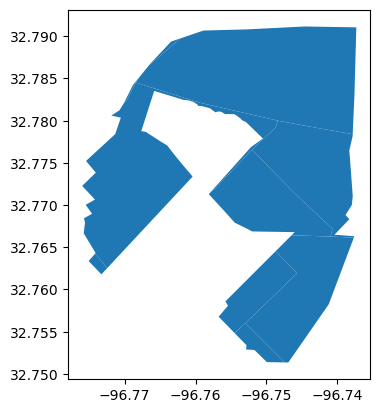

In [103]:
s[s["Name"] == "EPIC_Fair Park"].plot()

In [104]:
len(s)

53

In [105]:
fair_park = s[s["Name"] == "EPIC_Fair Park"]

In [106]:
fair_park.explore()

# Read the Poverty Data per Census Tract

In [115]:
poverty = pd.read_csv('../input/cpe-data/Dept_37-00049/37-00049_ACS_data/37-00049_ACS_poverty/ACS_15_5YR_S1701_with_ann.csv')

In [116]:
poverty.head()

,GEO.id,GEO.id2,GEO.display-label,HC01_EST_VC01,HC01_MOE_VC01,HC02_EST_VC01,HC02_MOE_VC01,HC03_EST_VC01,HC03_MOE_VC01,HC01_EST_VC03,...,HC02_EST_VC78,HC02_MOE_VC78,HC03_EST_VC78,HC03_MOE_VC78,HC01_EST_VC79,HC01_MOE_VC79,HC02_EST_VC79,HC02_MOE_VC79,HC03_EST_VC79,HC03_MOE_VC79
0,Id,Id2,Geography,Total; Estimate; Population for whom poverty s...,Total; Margin of Error; Population for whom po...,Below poverty level; Estimate; Population for ...,Below poverty level; Margin of Error; Populati...,Percent below poverty level; Estimate; Populat...,Percent below poverty level; Margin of Error; ...,Total; Estimate; AGE - Under 18 years,...,Below poverty level; Estimate; Worked less tha...,Below poverty level; Margin of Error; Worked l...,Percent below poverty level; Estimate; Worked ...,Percent below poverty level; Margin of Error; ...,Total; Estimate; Did not work,Total; Margin of Error; Did not work,Below poverty level; Estimate; Did not work,Below poverty level; Margin of Error; Did not ...,Percent below poverty level; Estimate; Did not...,Percent below poverty level; Margin of Error; ...
1,1400000US48113000100,48113000100,"Census Tract 1, Dallas County, Texas",3951,233,257,154,6.5,3.8,793,...,72,58,29.3,20.4,210,75,95,60,45.2,20.4
2,1400000US48113000201,48113000201,"Census Tract 2.01, Dallas County, Texas",2907,228,104,77,3.6,2.7,654,...,43,49,33.6,30.0,224,93,61,60,27.2,21.4
3,1400000US48113000202,48113000202,"Census Tract 2.02, Dallas County, Texas",3759,261,139,93,3.7,2.5,658,...,51,35,18.6,9.9,113,48,16,19,14.2,15.8
4,1400000US48113000300,48113000300,"Census Tract 3, Dallas County, Texas",4316,455,348,225,8.1,5.1,628,...,221,144,41.5,19.3,251,135,112,114,44.6,30.3


In [117]:
poverty = poverty.iloc[1:] ; 

In [118]:
poverty

,GEO.id,GEO.id2,GEO.display-label,HC01_EST_VC01,HC01_MOE_VC01,HC02_EST_VC01,HC02_MOE_VC01,HC03_EST_VC01,HC03_MOE_VC01,HC01_EST_VC03,...,HC02_EST_VC78,HC02_MOE_VC78,HC03_EST_VC78,HC03_MOE_VC78,HC01_EST_VC79,HC01_MOE_VC79,HC02_EST_VC79,HC02_MOE_VC79,HC03_EST_VC79,HC03_MOE_VC79
1,1400000US48113000100,48113000100,"Census Tract 1, Dallas County, Texas",3951,233,257,154,6.5,3.8,793,...,72,58,29.3,20.4,210,75,95,60,45.2,20.4
2,1400000US48113000201,48113000201,"Census Tract 2.01, Dallas County, Texas",2907,228,104,77,3.6,2.7,654,...,43,49,33.6,30.0,224,93,61,60,27.2,21.4
3,1400000US48113000202,48113000202,"Census Tract 2.02, Dallas County, Texas",3759,261,139,93,3.7,2.5,658,...,51,35,18.6,9.9,113,48,16,19,14.2,15.8
4,1400000US48113000300,48113000300,"Census Tract 3, Dallas County, Texas",4316,455,348,225,8.1,5.1,628,...,221,144,41.5,19.3,251,135,112,114,44.6,30.3
5,1400000US48113000401,48113000401,"Census Tract 4.01, Dallas County, Texas",6403,718,2182,620,34.1,8.0,1437,...,362,178,60.9,16.8,1208,372,1080,343,89.4,7.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525,1400000US48113020500,48113020500,"Census Tract 205, Dallas County, Texas",5123,398,2912,483,56.8,8.2,1905,...,24,20,29.3,22.5,570,105,445,110,78.1,10.4
526,1400000US48113020600,48113020600,"Census Tract 206, Dallas County, Texas",2414,194,32,19,1.3,0.8,566,...,12,13,33.3,31.3,118,51,20,14,16.9,13.4
527,1400000US48113020700,48113020700,"Census Tract 207, Dallas County, Texas",4324,347,128,99,3.0,2.4,524,...,80,62,14.7,11.3,335,172,15,27,4.5,8.9
528,1400000US48113980000,48113980000,"Census Tract 9800, Dallas County, Texas",0,13,0,13,-,**,0,...,0,13,-,**,0,13,0,13,-,**


In [119]:
fair_park_poverty = pd.merge(fair_park,poverty, how='inner', left_on="GEOID", right_on="GEO.id2")

In [120]:
fair_park_poverty["HC02_EST_VC01"] = (fair_park_poverty["HC02_EST_VC01"]).apply(lambda x : int(x))
fair_park_poverty["HC01_EST_VC01"] = (fair_park_poverty["HC01_EST_VC01"]).apply(lambda x : int(x))
fair_park_poverty["BPL"] = fair_park_poverty["HC02_EST_VC01"] / fair_park_poverty["HC01_EST_VC01"] * 100

In [121]:
len(fair_park_poverty)

10

# Display the Poverty Map

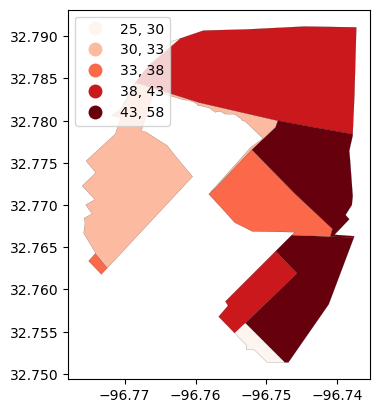

In [122]:
ax = fair_park_poverty.plot(
    column="BPL",  # Data to plot
    scheme="Quantiles",  # Classification scheme
    cmap="Reds",  # Color palette
    edgecolor="k",  # Borderline color
    linewidth=0.1,  # Borderline width
    legend=True,  # Add legend
    legend_kwds={
        "fmt": "{:.0f}",
        "loc":"upper left"
    },  # Remove decimals in legend (for legibility)
     missing_kwds={
        "color": "lightgrey",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Missing values",
     },
    
)

In [91]:
fair_park.area.sum()

C:\Users\ambar\AppData\Local\Temp\ipykernel_11460\4075780366.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  fair_park.area.sum()


0.0008328353891981901